In [3]:
!pip install yellowbrick
!pip install openpyxl

import pandas as pd  
import numpy as np  
import seaborn as sns  
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore')

from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from yellowbrick.cluster import KElbowVisualizer
from sklearn.preprocessing import StandardScaler


In [59]:
#Impoting data

from pandas.api.types import is_string_dtype, is_numeric_dtype    
df = pd.read_excel("Final Assignment - Week 9.xlsx")


In [7]:
df.head()
df.shape

(33713, 69)

In [60]:
#Drop unwanted columns
columns_to_drop = ['Dear Greg,','Unnamed: 66','Unnamed: 67','logtarg']
df.drop(columns_to_drop, axis=1, inplace=True)


In [61]:
#rename columns
df = df.rename(columns={'r': 'Recency','f':'Frequency','m':'Monetary','tof':'Timeonfile'})

In [62]:
df.head()

,id,Recency,Frequency,Monetary,Timeonfile,Ffiction1,Fclassics3,Fcartoons5,Flegends6,Fphilosophy7,Freligion8,Fpsychology9,Flinguistics10,Fart12,Fmusic14,Ffacsimile17,Fhistory19,Fconthist20,Feconomy21,Fpolitics22,Fscience23,Fcompsci26,Frailroads27,Fmaps30,Ftravelguides31,Fhealth35,Fcooking36,Flearning37,FGamesRiddles38,Fsports39,Fhobby40,Fnature41,Fencyclopaedia44,Fvideos50,Fnonbooks99,Mfiction1,Mclassics3,Mcartoons5,Mlegends6,Mphilosophy7,Mreligion8,Mpsychology9,Mlinguistics10,Mart12,Mmusic14,Mfacsimile17,Mhistory19,Mconthist20,Meconomy21,Mpolitics22,Mscience23,Mcompsci26,Mrailroads27,Mmaps30,Mtravelguides31,Mhealth35,Mcooking36,Mlearning37,MGamesRiddles38,Msports39,Mhobby40,Mnature41,Mencyclopaedia44,Mvideos50,Mnonbooks99
0,914,194,7,318.894775,1703,1,0,1,0,0,0,0,0,1,7,0,0,17,0,0,0,0,0,0,2,2,1,0,0,0,0,0,0,0,0,5.949997,0.0,7.643810,0.0,0.00000,0.000000,0.0,0.000000,8.589699,61.429962,0.0,0.000000,197.935547,0.000000,0.0,0.000000,0.000000,0.000000,0.0,12.271004,14.899994,10.174706,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
1,957,3,14,368.052246,2364,1,0,2,0,0,0,0,0,0,4,0,4,4,0,0,0,1,0,0,0,7,0,4,0,0,4,2,1,0,0,12.680038,0.0,20.236496,0.0,0.00000,0.000000,0.0,0.000000,0.000000,29.414169,0.0,53.839020,60.749969,0.000000,0.0,0.000000,5.899998,0.000000,0.0,0.000000,74.156250,0.000000,22.749985,0.0,0.0,61.176025,17.150269,10.0,0.000000,0.0
2,1406,1489,15,423.298340,2371,0,0,0,0,0,0,0,0,0,0,0,1,34,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,10.123573,413.174805,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
3,1414,155,4,71.217041,1290,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,71.217041,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0
4,1546,194,6,442.638184,2188,0,0,1,0,3,1,0,1,1,3,0,6,7,1,0,2,0,2,0,1,3,0,2,0,0,2,0,0,3,0,0.000000,0.0,8.899994,0.0,26.19841,19.899994,0.0,6.621227,15.313187,39.804047,0.0,64.744934,86.945740,5.112919,0.0,19.849991,0.000000,9.960655,0.0,10.123573,41.518219,0.000000,7.949997,0.0,0.0,17.895203,0.000000,0.0,61.799988,0.0


In [63]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
df.dtypes

id                    int64
Recency               int64
Frequency             int64
Monetary            float64
Timeonfile            int64
Ffiction1             int64
Fclassics3            int64
Fcartoons5            int64
Flegends6             int64
Fphilosophy7          int64
Freligion8            int64
Fpsychology9          int64
Flinguistics10        int64
Fart12                int64
Fmusic14              int64
Ffacsimile17          int64
Fhistory19            int64
Fconthist20           int64
Feconomy21            int64
Fpolitics22           int64
Fscience23            int64
Fcompsci26            int64
Frailroads27          int64
Fmaps30               int64
Ftravelguides31       int64
Fhealth35             int64
Fcooking36            int64
Flearning37           int64
FGamesRiddles38       int64
Fsports39             int64
Fhobby40              int64
Fnature41             int64
Fencyclopaedia44      int64
Fvideos50             int64
Fnonbooks99           int64
Mfiction1           

In [11]:
#check for missing values

df.isnull().sum(axis = 0)

id                      0
logtarg             25402
Recency                 0
Frequency               0
Monetary                0
Timeonfile              0
Ffiction1               0
Fclassics3              0
Fcartoons5              0
Flegends6               0
Fphilosophy7            0
Freligion8              0
Fpsychology9            0
Flinguistics10          0
Fart12                  0
Fmusic14                0
Ffacsimile17            0
Fhistory19              0
Fconthist20             0
Feconomy21              0
Fpolitics22             0
Fscience23              0
Fcompsci26              0
Frailroads27            0
Fmaps30                 0
Ftravelguides31         0
Fhealth35               0
Fcooking36              0
Flearning37             0
FGamesRiddles38         0
Fsports39               0
Fhobby40                0
Fnature41               0
Fencyclopaedia44        0
Fvideos50               0
Fnonbooks99             0
Mfiction1               0
Mclassics3              0
Mcartoons5  

In [23]:
#General statistical analysis

df.describe()

,id,Recency,Frequency,Monetary,Timeonfile,Ffiction1,Fclassics3,Fcartoons5,Flegends6,Fphilosophy7,Freligion8,Fpsychology9,Flinguistics10,Fart12,Fmusic14,Ffacsimile17,Fhistory19,Fconthist20,Feconomy21,Fpolitics22,Fscience23,Fcompsci26,Frailroads27,Fmaps30,Ftravelguides31,Fhealth35,Fcooking36,Flearning37,FGamesRiddles38,Fsports39,Fhobby40,Fnature41,Fencyclopaedia44,Fvideos50,Fnonbooks99,Mfiction1,Mclassics3,Mcartoons5,Mlegends6,Mphilosophy7,Mreligion8,Mpsychology9,Mlinguistics10,Mart12,Mmusic14,Mfacsimile17,Mhistory19,Mconthist20,Meconomy21,Mpolitics22,Mscience23,Mcompsci26,Mrailroads27,Mmaps30,Mtravelguides31,Mhealth35,Mcooking36,Mlearning37,MGamesRiddles38,Msports39,Mhobby40,Mnature41,Mencyclopaedia44,Mvideos50,Mnonbooks99
count,3.371300e+04,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.00000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000,33713.000000
mean,8.234209e+06,508.427254,5.820603,251.924325,1296.088186,0.590900,0.228102,0.356480,0.104767,0.290659,0.980957,0.046570,0.203215,0.608549,2.320974,0.050960,2.647940,2.153947,0.208377,0.029959,0.410791,0.150862,0.187020,0.074986,1.484976,2.109898,0.425444,0.61718,0.034497,0.001809,0.637736,0.317237,0.480912,0.407617,0.463174,5.191555,3.909188,2.493460,1.249562,3.806866,16.368536,0.716569,2.214243,10.756127,29.261677,3.694856,39.064488,24.951676,2.015893,0.315122,4.861522,1.328445,2.103172,1.456697,14.634508,29.095301,4.223431,21.147507,0.305226,0.020681,6.785558,3.728635,8.402428,6.020431,1.800973
std,4.426015e+06,542.440039,7.008049,3929.929826,818.976321,1.762201,0.865510,1.105653,0.527764,1.088606,3.112212,0.262156,0.641489,1.884077,6.681362,0.398608,5.930653,5.989002,0.755520,0.190992,1.480713,0.596788,0.974306,0.335845,4.368954,5.340294,1.695695,1.64184,0.207741,0.043191,1.723662,1.049727,1.253211,1.306615,1.447000,17.670335,28.864567,8.444797,8.180311,18.350047,797.146228,6.795593,9.197459,38.383837,1377.712988,90.674547,95.897338,71.814323,8.020535,2.206537,19.315840,5.783000,10.894953,10.671295,44.685317,2087.221131,19.975164,2898.452008,1.991675,0.501499,21.197488,15.007592,46.021881,19.643978,21.383867
min,9.140000e+02,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.391616e+06,117.000000,1.000000,39.899994,536.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0

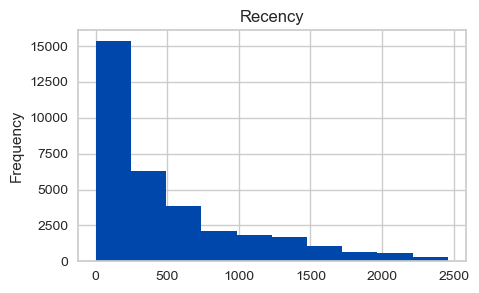

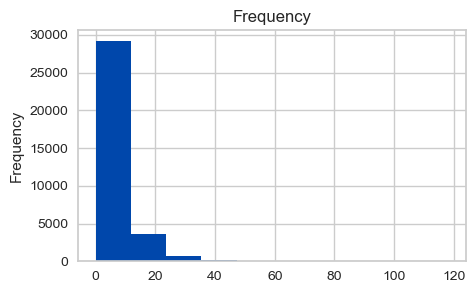

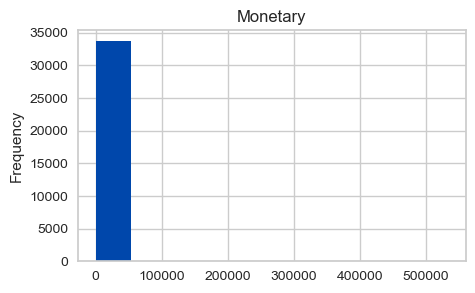

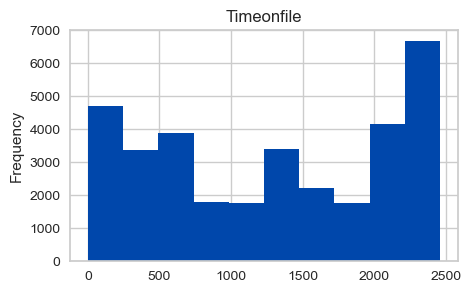

In [27]:
#Histogram
hist_column = ['Recency','Frequency','Monetary','Timeonfile']
for column in hist_column:
    plt.figure(column,figsize =(5,3))
    plt.title(column)
    ax = fig.gca()
    df[column].plot(kind = 'hist',color = '#0047AB')

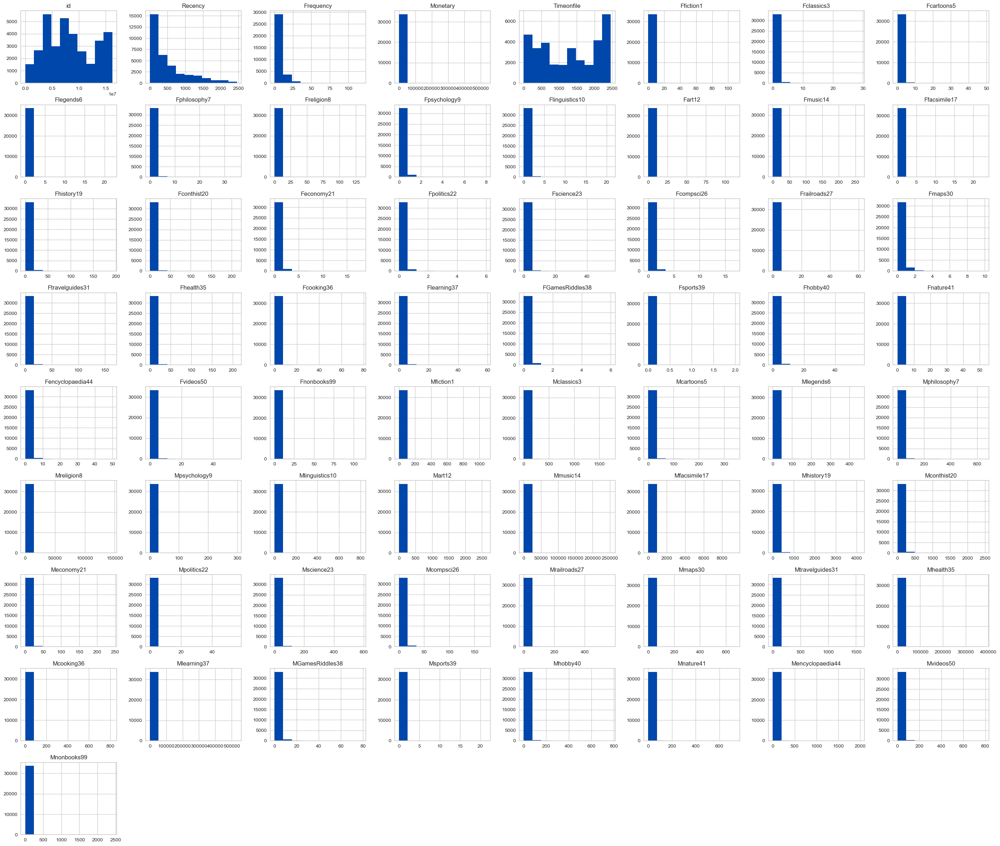

In [26]:
fig = plt.figure(figsize = (35,30))
ax = fig.gca()
df.hist(ax = ax, color = '#0047AB')
pass

In [64]:
#To check if the customer id is unique

num_unique_records = df['id'].nunique()
num_unique_records

33713

In [65]:
#RFM Score

df["recency_score"] = pd.qcut(df["Recency"].rank(method="first"),5,labels=[1,2,3,4,5])

df["frequency_score"] = pd.qcut(df["Frequency"].rank(method="first"),5,labels=[1,2,3,4,5])

df["monetary_score"] = pd.qcut(df["Monetary"].rank(method="first"),5,labels=[1,2,3,4,5])

df["rfm_score"] = df["recency_score"].astype("str")+df["frequency_score"].astype("str")+df["monetary_score"].astype("str")
df.head()

,id,Recency,Frequency,Monetary,Timeonfile,Ffiction1,Fclassics3,Fcartoons5,Flegends6,Fphilosophy7,Freligion8,Fpsychology9,Flinguistics10,Fart12,Fmusic14,Ffacsimile17,Fhistory19,Fconthist20,Feconomy21,Fpolitics22,Fscience23,Fcompsci26,Frailroads27,Fmaps30,Ftravelguides31,Fhealth35,Fcooking36,Flearning37,FGamesRiddles38,Fsports39,Fhobby40,Fnature41,Fencyclopaedia44,Fvideos50,Fnonbooks99,Mfiction1,Mclassics3,Mcartoons5,Mlegends6,Mphilosophy7,Mreligion8,Mpsychology9,Mlinguistics10,Mart12,Mmusic14,Mfacsimile17,Mhistory19,Mconthist20,Meconomy21,Mpolitics22,Mscience23,Mcompsci26,Mrailroads27,Mmaps30,Mtravelguides31,Mhealth35,Mcooking36,Mlearning37,MGamesRiddles38,Msports39,Mhobby40,Mnature41,Mencyclopaedia44,Mvideos50,Mnonbooks99,recency_score,frequency_score,monetary_score,rfm_score
0,914,194,7,318.894775,1703,1,0,1,0,0,0,0,0,1,7,0,0,17,0,0,0,0,0,0,2,2,1,0,0,0,0,0,0,0,0,5.949997,0.0,7.643810,0.0,0.00000,0.000000,0.0,0.000000,8.589699,61.429962,0.0,0.000000,197.935547,0.000000,0.0,0.000000,0.000000,0.000000,0.0,12.271004,14.899994,10.174706,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2,4,5,245
1,957,3,14,368.052246,2364,1,0,2,0,0,0,0,0,0,4,0,4,4,0,0,0,1,0,0,0,7,0,4,0,0,4,2,1,0,0,12.680038,0.0,20.236496,0.0,0.00000,0.000000,0.0,0.000000,0.000000,29.414169,0.0,53.839020,60.749969,0.000000,0.0,0.000000,5.899998,0.000000,0.0,0.000000,74.156250,0.000000,22.749985,0.0,0.0,61.176025,17.150269,10.0,0.000000,0.0,1,5,5,155
2,1406,1489,15,423.298340,2371,0,0,0,0,0,0,0,0,0,0,0,1,34,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,10.123573,413.174805,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,5,5,5,555
3,1414,155,4,71.217041,1290,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,71.217041,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2,3,2,232
4,1546,194,6,442.638184,2188,0,0,1,0,3,1,0,1,1,3,0,6,7,1,0,2,0,2,0,1,3,0,2,0,0,2,0,0,3,0,0.000000,0.0,8.899994,0.0,26.19841,19.899994,0.0,6.621227,15.313187,39.804047,0.0,64.744934,86.945740,5.112919,0.0,19.849991,0.000000,9.960655,0.0,10.123573,41.518219,0.000000,7.949997,0.0,0.0,17.895203,0.000000,0.0,61.799988,0.0,2,4,5,245


In [66]:
seg_map = {
    r'[1-2][1-2][1-5]': 'High Risk Customers',
    r'[1-2][3-4][1-5]': 'High Risk Customers',
    r'[1-2]5[1-5]': 'High Risk Customers',
    r'3[1-2][1-5]': 'Medium Risk Customers',
    r'33[1-5]': 'Medium Risk Customers',
    r'[3-4][4-5][1-5]': 'Regular_customers',
    r'41[1-5]': 'Promising Customers',
    r'51[1-5]': 'New Customers',
    r'[4-5][2-3][4-5]': 'Loyal Customers',
    r'5[4-5][4-5]': 'Loyal Customers',
    r'[4-5][2-3][1-3]': 'Regular Customers',
    r'5[4-5][1-3]': 'Regular Customers'
}


df['RFM_segment'] = df['rfm_score'].replace(seg_map, regex=True)

df.reset_index()
df.head(10)

,id,Recency,Frequency,Monetary,Timeonfile,Ffiction1,Fclassics3,Fcartoons5,Flegends6,Fphilosophy7,Freligion8,Fpsychology9,Flinguistics10,Fart12,Fmusic14,Ffacsimile17,Fhistory19,Fconthist20,Feconomy21,Fpolitics22,Fscience23,Fcompsci26,Frailroads27,Fmaps30,Ftravelguides31,Fhealth35,Fcooking36,Flearning37,FGamesRiddles38,Fsports39,Fhobby40,Fnature41,Fencyclopaedia44,Fvideos50,Fnonbooks99,Mfiction1,Mclassics3,Mcartoons5,Mlegends6,Mphilosophy7,Mreligion8,Mpsychology9,Mlinguistics10,Mart12,Mmusic14,Mfacsimile17,Mhistory19,Mconthist20,Meconomy21,Mpolitics22,Mscience23,Mcompsci26,Mrailroads27,Mmaps30,Mtravelguides31,Mhealth35,Mcooking36,Mlearning37,MGamesRiddles38,Msports39,Mhobby40,Mnature41,Mencyclopaedia44,Mvideos50,Mnonbooks99,recency_score,frequency_score,monetary_score,rfm_score,RFM_segment
0,914,194,7,318.894775,1703,1,0,1,0,0,0,0,0,1,7,0,0,17,0,0,0,0,0,0,2,2,1,0,0,0,0,0,0,0,0,5.949997,0.000000,7.643810,0.0,0.00000,0.000000,0.0,0.000000,8.589699,61.429962,0.0,0.000000,197.935547,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,12.271004,14.899994,10.174706,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,2,4,5,245,High Risk Customers
1,957,3,14,368.052246,2364,1,0,2,0,0,0,0,0,0,4,0,4,4,0,0,0,1,0,0,0,7,0,4,0,0,4,2,1,0,0,12.680038,0.000000,20.236496,0.0,0.00000,0.000000,0.0,0.000000,0.000000,29.414169,0.0,53.839020,60.749969,0.000000,0.000000,0.000000,5.899998,0.000000,0.0,0.000000,74.156250,0.000000,22.749985,0.000000,0.0,61.176025,17.150269,10.000000,0.000000,0.0,1,5,5,155,High Risk Customers
2,1406,1489,15,423.298340,2371,0,0,0,0,0,0,0,0,0,0,0,1,34,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,10.123573,413.174805,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,5,5,5,555,Loyal Customers
3,1414,155,4,71.217041,1290,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,71.217041,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,2,3,2,232,High Risk Customers
4,1546,194,6,442.638184,2188,0,0,1,0,3,1,0,1,1,3,0,6,7,1,0,2,0,2,0,1,3,0,2,0,0,2,0,0,3,0,0.000000,0.000000,8.899994,0.0,26.19841,19.899994,0.0,6.621227,15.313187,39.804047,0.0,64.744934,86.945740,5.112919,0.000000,19.849991,0.000000,9.960655,0.0,10.123573,41.518219,0.000000,7.949997,0.000000,0.0,17.895203,0.000000,0.000000,61.799988,0.0,2,4,5,245,High Risk Customers
5,1651,1797,2,47.933594,1808,0,0,0,0,0,0,0,0,0,0,0,2,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,17.332779,10.200272,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,20.400543,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,5,2,2,522,Regular Customers
6,2046,383,3,52.399658,2186,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,27.136490,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,9.949997,0.0,0.000000,15.313187,0.000000,0.000000,0.0,3,3,2,332,Medium Risk Customers
7,2534,80,7,119.282043,2063,0,0,0,0,0,0,0,0,0,1,0,0,11,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,6.544533,0.0,0.000000,108.672729,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,4.064770,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,1,4,3,143,High Risk Customers
8,2801,96,9,164.324341,2453,1,1,0,0,0,0,0,0,0,0,0,7,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0.000000,25.539017,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,103.224976,20.323837,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,15.236496,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0

In [69]:
df[['id', 'recency_score', 'frequency_score', 'monetary_score', 'rfm_score', 'RFM_segment']]

,id,recency_score,frequency_score,monetary_score,rfm_score,RFM_segment
0,914,2,4,5,245,High Risk Customers
1,957,1,5,5,155,High Risk Customers
2,1406,5,5,5,555,Loyal Customers
3,1414,2,3,2,232,High Risk Customers
4,1546,2,4,5,245,High Risk Customers
5,1651,5,2,2,522,Regular Customers
6,2046,3,3,2,332,Medium Risk Customers
7,2534,1,4,3,143,High Risk Customers
8,2801,2,4,4,244,High Risk Customers
9,3689,4,3,3,433,Regular Customers


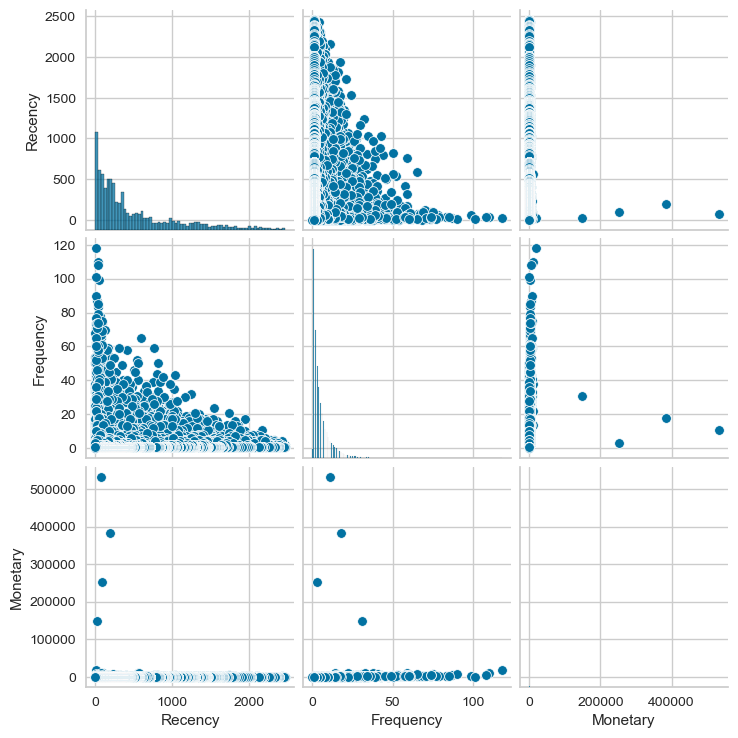

In [74]:
#Scatter Plot
plot_columns = ["Recency","Frequency","Monetary"]
sns.pairplot(df[plot_columns])

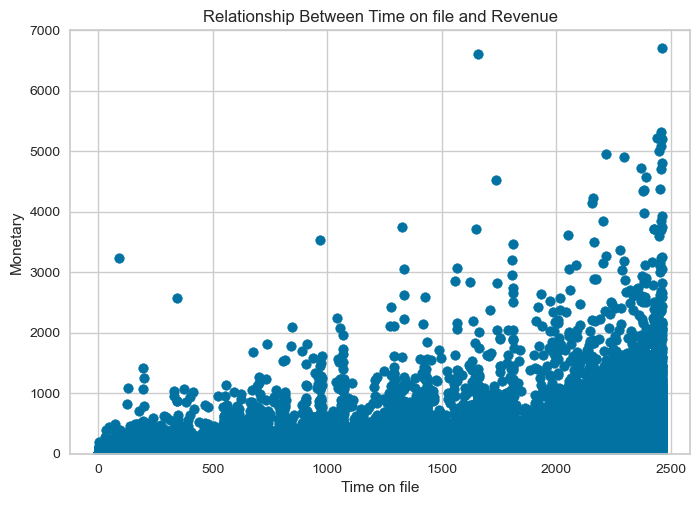

In [41]:
plot_columns = ["Timeonfile","Monetary"]
x = df["Timeonfile"]
y = df["Monetary"]
# Plotting the scatter plot
plt.scatter(x,y)

plt.ylim(0, 7000)
# Adding labels and a title
plt.xlabel('Time on file')
plt.ylabel('Monetary')
plt.title('Relationship Between Time on file and Revenue')

# Displaying the plot
plt.show()

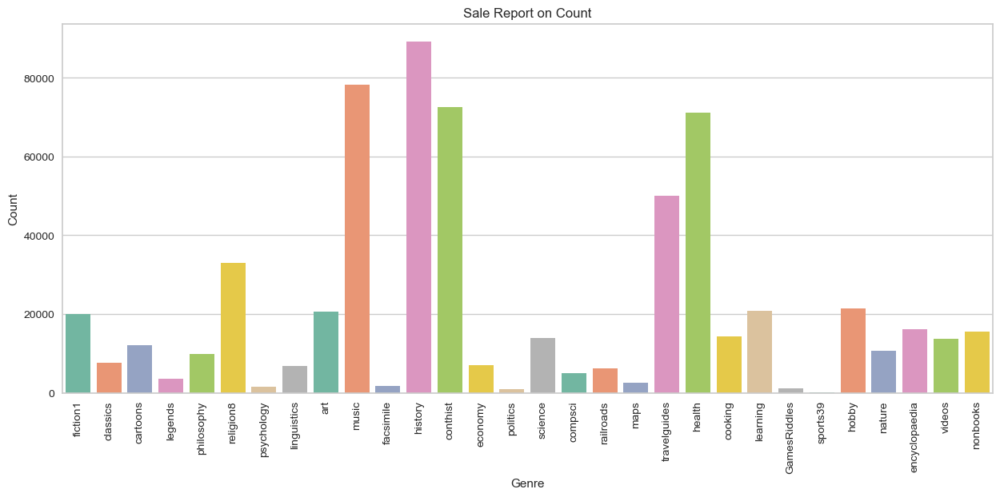

In [71]:
#Bar Chart
aix = ["fiction1","classics","cartoons","legends","philosophy","religion8","psychology","linguistics","art","music","facsimile","history","conthist","economy","politics","science","compsci","railroads","maps","travelguides","health","cooking","learning","GamesRiddles","sports39","hobby","nature","encyclopaedia","videos","nonbooks"]


aiy = [sum(df["Ffiction1"]),sum(df["Fclassics3"]),sum(df["Fcartoons5"]),sum(df["Flegends6"]),sum(df["Fphilosophy7"]),sum(df["Freligion8"]),sum(df["Fpsychology9"]),sum(df["Flinguistics10"]),sum(df["Fart12"]),sum(df["Fmusic14"]),sum(df["Ffacsimile17"]),sum(df["Fhistory19"]),sum(df["Fconthist20"]),sum(df["Feconomy21"]),sum(df["Fpolitics22"]),sum(df["Fscience23"]),sum(df["Fcompsci26"]),sum(df["Frailroads27"]),sum(df["Fmaps30"]),sum(df["Ftravelguides31"]),sum(df["Fhealth35"]),sum(df["Fcooking36"]),sum(df["Flearning37"]),sum(df["FGamesRiddles38"]),sum(df["Fsports39"]),sum(df["Fhobby40"]),sum(df["Fnature41"]),sum(df["Fencyclopaedia44"]),sum(df["Fvideos50"]),sum(df["Fnonbooks99"])]

plt.figure(figsize=(15,6))
sns.barplot(x=aix, y=aiy, palette="Set2")
plt.title("Sales Report on ")
plt.xlabel("Genre")
plt.xticks(rotation=90)
plt.ylabel("Count")
plt.show()

In [72]:
df_rfm = df[['Recency','Frequency','Monetary']]

sc = MinMaxScaler((0, 1))
df_rfm = sc.fit_transform(df_rfm)

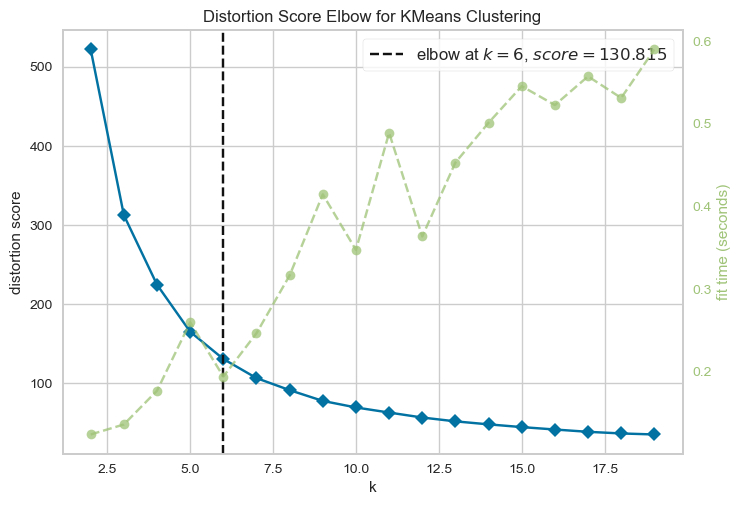

6

In [73]:
kmeans = KMeans()
elbow = KElbowVisualizer(kmeans,k=(2, 20))
elbow.fit(df_rfm)
elbow.show()

elbow.elbow_value_


In [74]:
kmeans = KMeans(n_clusters=elbow.elbow_value_).fit(df_rfm)

kmeans.cluster_centers_

array([[5.13514856e-02, 3.93301105e-02, 4.02201143e-04],
       [3.72381511e-01, 3.73937179e-02, 3.20080336e-04],
       [5.79776619e-01, 2.62739114e-02, 2.29509204e-04],
       [1.86641161e-01, 3.92287191e-02, 3.21344587e-04],
       [8.29447133e-01, 1.80333673e-02, 1.63393503e-04],
       [4.54216483e-02, 2.03745430e-01, 2.07289418e-03]])

In [75]:
kmeans.labels_

array([0, 0, 2, ..., 0, 0, 0], dtype=int32)

In [76]:
kmeans.inertia_

130.82726886337682

In [77]:
clusters = kmeans.labels_

df_rfm = df[['id','Recency','Frequency','Monetary']]
df_rfm["KMeans_Segment"] = clusters

df_rfm["KMeans_Segment"] = df_rfm["KMeans_Segment"] + 1

df_rfm.head()

,id,Recency,Frequency,Monetary,KMeans_Segment
0,914,194,7,318.894775,1
1,957,3,14,368.052246,1
2,1406,1489,15,423.298340,3
3,1414,155,4,71.217041,1
4,1546,194,6,442.638184,1


In [78]:
df_rfm["RFM Segment"] = df['RFM_segment']
df_rfm.head()

,id,Recency,Frequency,Monetary,KMeans_Segment,RFM Segment
0,914,194,7,318.894775,1,High Risk Customers
1,957,3,14,368.052246,1,High Risk Customers
2,1406,1489,15,423.298340,3,Loyal Customers
3,1414,155,4,71.217041,1,High Risk Customers
4,1546,194,6,442.638184,1,High Risk Customers


In [79]:
# Count of segmentation
df_rfm[["RFM Segment","Recency","Frequency","Monetary"]].groupby(["RFM Segment"]).agg(["mean","count"])

Recency         Frequency           Monetary       
                              mean  count       mean  count        mean  count
RFM Segment                                                                   
High Risk Customers      90.084687  13485   7.713830  13485  372.472550  13485
Loyal Customers        1166.372145   2233   5.696373   2233  310.012626   2233
Medium Risk Customers   297.520807   4013   1.957139   4013   64.336312   4013
New Customers          1574.964325   1822   1.000000   1822   42.428947   1822
Promising Customers     635.503849   1169   1.000000   1169   33.503337   1169
Regular Customers      1084.168028   5630   2.661634   5630   67.544789   5630
Regular_customers       449.729715   5361  10.009140   5361  377.381927   5361

In [80]:
df_rfm[["KMeans_Segment","Recency","Frequency","Monetary"]].groupby(["KMeans_Segment"]).agg(["mean","count"])

Recency         Frequency            Monetary       
                       mean  count       mean  count         mean  count
KMeans_Segment                                                          
1                126.324655  14480   4.640953  14480   214.329772  14480
2                916.105313   4235   4.410626   4235   170.549817   4235
3               1425.675145   3106   3.103348   3106   122.337738   3106
4                459.206817   7804   4.628011   7804   171.240550   7804
5               2039.440468   1537   2.126871   1537    87.119049   1537
6                111.840063   2551  24.039592   2551  1104.314761   2551

In [81]:
segmentation = df.merge(df_rfm, on="id")
segmentation.head()

,id,Recency_x,Frequency_x,Monetary_x,Timeonfile,Ffiction1,Fclassics3,Fcartoons5,Flegends6,Fphilosophy7,Freligion8,Fpsychology9,Flinguistics10,Fart12,Fmusic14,Ffacsimile17,Fhistory19,Fconthist20,Feconomy21,Fpolitics22,Fscience23,Fcompsci26,Frailroads27,Fmaps30,Ftravelguides31,Fhealth35,Fcooking36,Flearning37,FGamesRiddles38,Fsports39,Fhobby40,Fnature41,Fencyclopaedia44,Fvideos50,Fnonbooks99,Mfiction1,Mclassics3,Mcartoons5,Mlegends6,Mphilosophy7,Mreligion8,Mpsychology9,Mlinguistics10,Mart12,Mmusic14,Mfacsimile17,Mhistory19,Mconthist20,Meconomy21,Mpolitics22,Mscience23,Mcompsci26,Mrailroads27,Mmaps30,Mtravelguides31,Mhealth35,Mcooking36,Mlearning37,MGamesRiddles38,Msports39,Mhobby40,Mnature41,Mencyclopaedia44,Mvideos50,Mnonbooks99,recency_score,frequency_score,monetary_score,rfm_score,RFM_segment,Recency_y,Frequency_y,Monetary_y,KMeans_Segment,RFM Segment
0,914,194,7,318.894775,1703,1,0,1,0,0,0,0,0,1,7,0,0,17,0,0,0,0,0,0,2,2,1,0,0,0,0,0,0,0,0,5.949997,0.0,7.643810,0.0,0.00000,0.000000,0.0,0.000000,8.589699,61.429962,0.0,0.000000,197.935547,0.000000,0.0,0.000000,0.000000,0.000000,0.0,12.271004,14.899994,10.174706,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2,4,5,245,High Risk Customers,194,7,318.894775,1,High Risk Customers
1,957,3,14,368.052246,2364,1,0,2,0,0,0,0,0,0,4,0,4,4,0,0,0,1,0,0,0,7,0,4,0,0,4,2,1,0,0,12.680038,0.0,20.236496,0.0,0.00000,0.000000,0.0,0.000000,0.000000,29.414169,0.0,53.839020,60.749969,0.000000,0.0,0.000000,5.899998,0.000000,0.0,0.000000,74.156250,0.000000,22.749985,0.0,0.0,61.176025,17.150269,10.0,0.000000,0.0,1,5,5,155,High Risk Customers,3,14,368.052246,1,High Risk Customers
2,1406,1489,15,423.298340,2371,0,0,0,0,0,0,0,0,0,0,0,1,34,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,10.123573,413.174805,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,5,5,5,555,Loyal Customers,1489,15,423.298340,3,Loyal Customers
3,1414,155,4,71.217041,1290,0,0,0,0,0,0,0,0,0,0,0,0,7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.0,0.000000,0.0,0.00000,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,71.217041,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.0,2,3,2,232,High Risk Customers,155,4,71.217041,1,High Risk Customers
4,1546,194,6,442.638184,2188,0,0,1,0,3,1,0,1,1,3,0,6,7,1,0,2,0,2,0,1,3,0,2,0,0,2,0,0,3,0,0.000000,0.0,8.899994,0.0,26.19841,19.899994,0.0,6.621227,15.313187,39.804047,0.0,64.744934,86.945740,5.112919,0.0,19.849991,0.000000,9.960655,0.0,10.123573,41.518219,0.000000,7.949997,0.0,0.0,17.895203,0.000000,0.0,61.799988,0.0,2,4,5,245,High Risk Customers,194,6,442.638184,1,High Risk Customers


In [82]:
pd.DataFrame(segmentation[["RFM Segment", "KMeans_Segment"]].groupby(["KMeans_Segment", "RFM Segment"])["RFM Segment"].agg("count"))


RFM Segment
KMeans_Segment RFM Segment                       
1              High Risk Customers          11395
               Medium Risk Customers         1874
               Regular_customers             1211
2              Loyal Customers                886
               New Customers                  374
               Promising Customers            414
               Regular Customers             1791
               Regular_customers              770
3              Loyal Customers                786
               New Customers                  837
               Regular Customers             1483
4              Loyal Customers                345
               Medium Risk Customers         2139
               Promising Customers            755
               Regular Customers             1646
               Regular_customers             2919
5              Loyal Customers                216
               New Customers                  611
               Regular Customers              710
6              High Risk Customers           2090
               Regular_customers              461